In [1]:
import os
import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")

from typing import Tuple, List

print(os.getcwd())

i:\我的雲端硬碟\Bio_Lab\碩論\code\benchmark\notebook


In [2]:
import logomaker
# create Logo object
def plot_pwm(df: pd.DataFrame, ax: plt.Axes, xlabel: str, ylabel: str, xtick_scale: int, mark_range: Tuple[Tuple[int]]=None) -> plt.Axes:

    crp_logo = logomaker.Logo(df=df,
                                shade_below=.5,
                                fade_below=.5,
                                ax=ax
                                # figsize=(10, 3)
                                )

    # style using Logo methods
    crp_logo.style_spines(visible=False)
    crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
    crp_logo.style_xticks(fmt='%d', anchor=0)

    if mark_range != None:
        for range_ in mark_range:
            crp_logo.highlight_position_range(range_[0], range_[1], color='mistyrose')

    # style using Axes methods
    crp_logo.ax.set_xlabel(xlabel, labelpad=10)
    crp_logo.ax.set_ylabel(ylabel, labelpad=10)
    crp_logo.ax.xaxis.set_ticks_position('none')
    crp_logo.ax.xaxis.set_tick_params(pad=-1)


    vis_tick = np.arange(0, df.shape[0], step=round(df.shape[0]/20))
    crp_logo.ax.set_xticks(vis_tick, vis_tick*xtick_scale)

    return crp_logo


In [3]:
tar_files = {
    'BaseCNN-gm12878(1kb)': '../output\XAI\BaseCNN-gm12878.ctcf-1kb/attribution.h5',
    'BaseCNN-helas3(1kb)': '../output\XAI\BaseCNN-helas3.ctcf-1kb/attribution.h5',
    'MCIENet-gm12878(1kb)': '../output\XAI\MCIENet-gm12878.ctcf-1kb/attribution.h5',
    'MCIENet-helas3(1kb)': '../output\XAI\MCIENet-helas3.ctcf-1kb/attribution.h5',
    'BaseCNN-gm12878(3kb)': '../output\XAI\BaseCNN-gm12878.ctcf-3kb/attribution.h5',
    'BaseCNN-helas3(3kb)': '../output\XAI\BaseCNN-helas3.ctcf-3kb/attribution.h5',
    'MCIENet-gm12878(3kb)': '../output\XAI\MCIENet-gm12878.ctcf-3kb/attribution.h5',
    'MCIENet-helas3(3kb)': '../output\XAI\MCIENet-helas3.ctcf-3kb/attribution.h5'
}

output_folder = '../output/XAI-plot/'

os.makedirs(output_folder, exist_ok=True)

tar_phase = 'test'

### Attribution of positive and negative samples

In [4]:
def plot_matrix(ax: plt.Axes, mat: np.array, bin_s: int=50, roll_step: int=50,
                mark_range: List[List[int]] = None, 
                xlabel: str=f'Gene Loci', ylabel: str='DeepLift',
                labels: List[str]=['A', 'G', 'C', 'T']
                ) -> plt.Axes:
    df_attr = pd.DataFrame(mat, index=labels)
    df_attr_roll = df_attr.T.rolling(window=bin_s, step=roll_step).sum().dropna() / bin_s
    df_attr_roll.reset_index(drop=True, inplace=True)

    xlabel = xlabel + f'({bin_s}bp)' if xlabel != None else ''

    ax = plot_pwm(df_attr_roll, ax=ax, xlabel=xlabel, ylabel=ylabel, xtick_scale=bin_s,
                mark_range=mark_range)

    return ax

In [5]:
data_ls = ['gm12878(1kb)', 'helas3(1kb)', 'gm12878(3kb)', 'helas3(3kb)']

BaseCNN_files = {k:v for k,v in  tar_files.items() if k.find('BaseCNN')!=-1}
MCIENet_files = {k:v for k,v in  tar_files.items() if k.find('MCIENet')!=-1}

In [23]:
def scale_and_normalize_batch(tensor):
  """
  批次處理矩陣，對每個矩陣進行縮放和歸一化。

  Args:
    tensor: 形狀為 (batch_size, rows, cols) 的三維張量。

  Returns:
    處理後的張量。
  """

  # 計算每個矩陣的絕對值之和
  total_abs_sums = np.sum(np.abs(tensor), axis=(1, 2))

  # 避免除以零
  total_abs_sums[total_abs_sums == 0] = 1e-12

  # 計算縮放因子
  scale_factors = 1 / total_abs_sums

  # 擴展縮放因子維度，以便與原張量進行廣播運算
  scale_factors = scale_factors[:, np.newaxis, np.newaxis]

  # 縮放並歸一化
  scaled_tensor = tensor * scale_factors

  return scaled_tensor

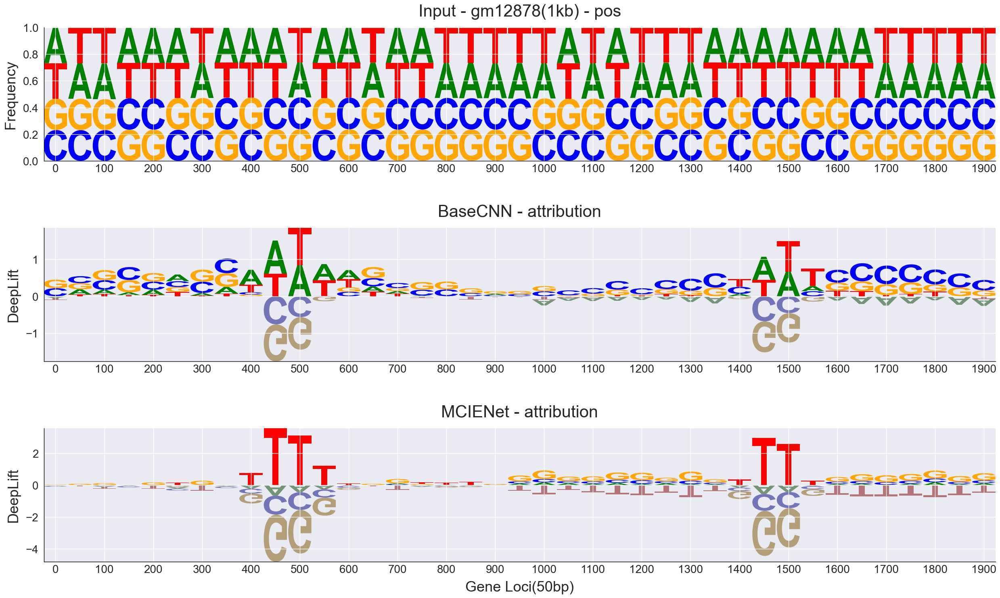

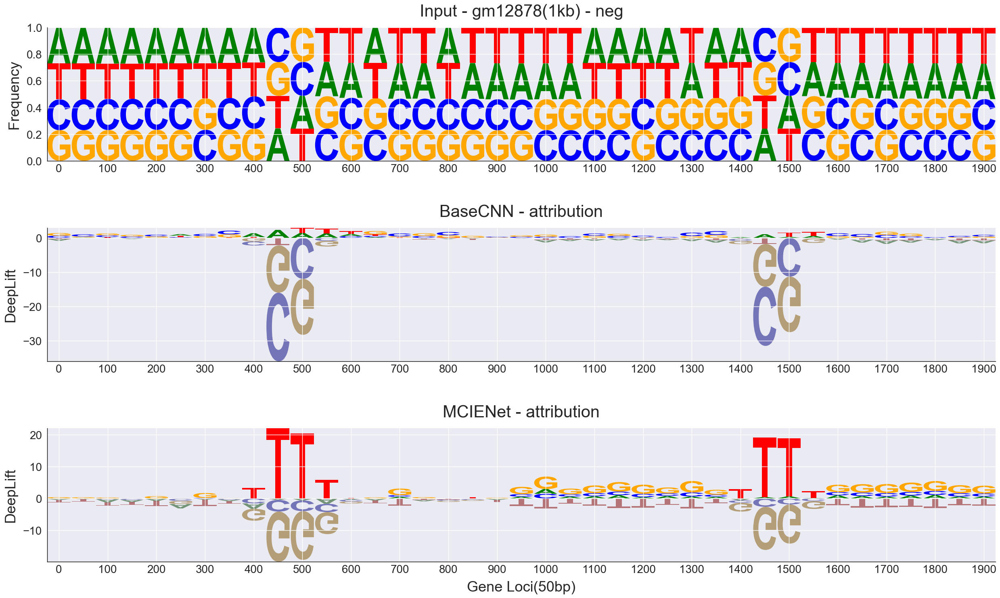

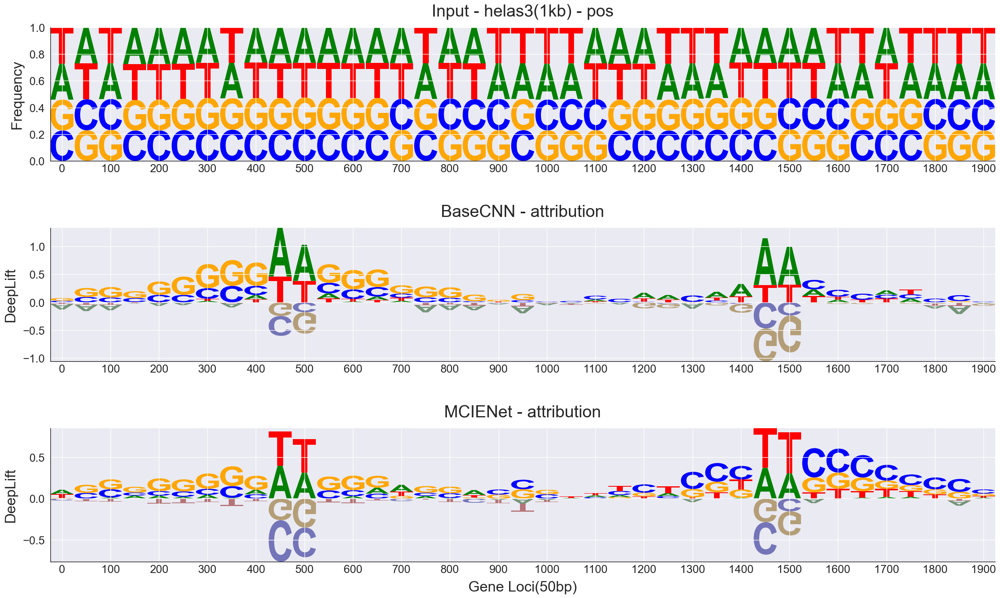

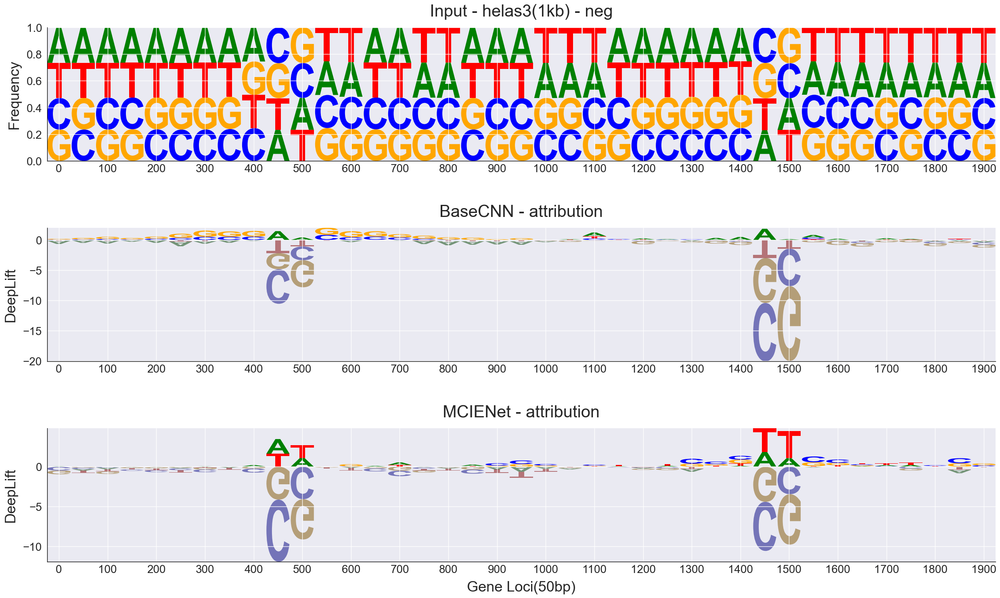

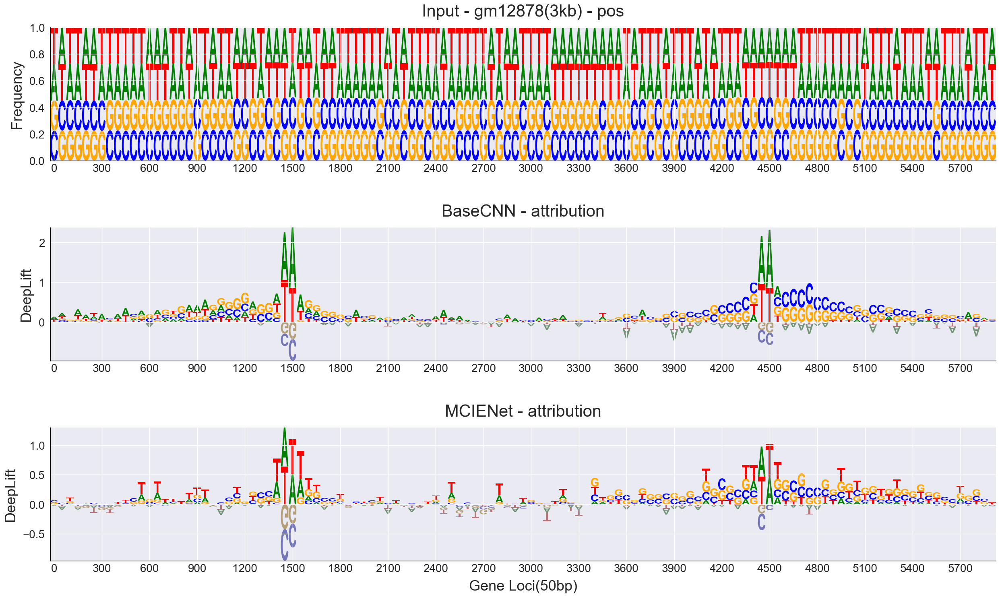

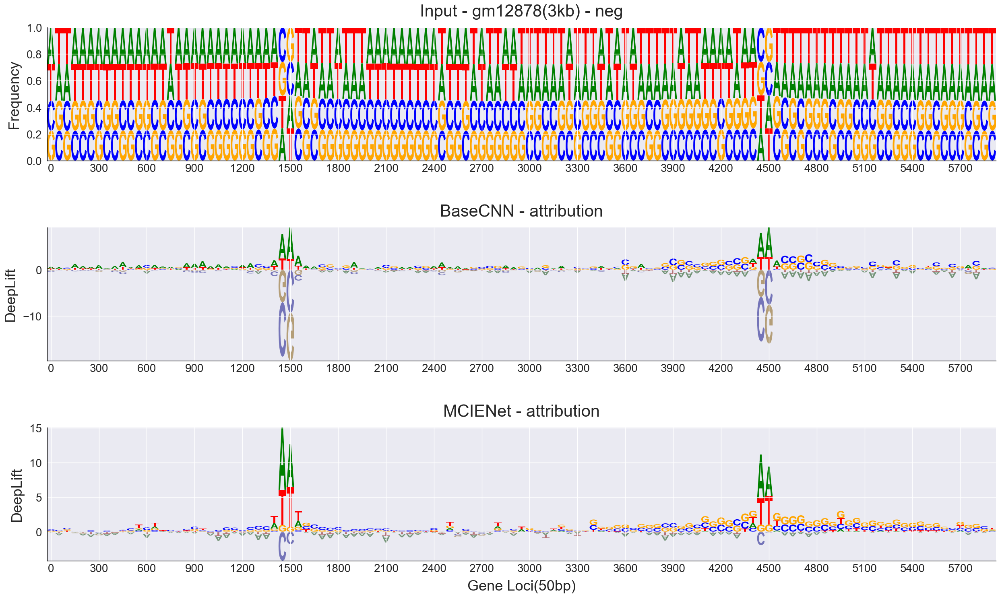

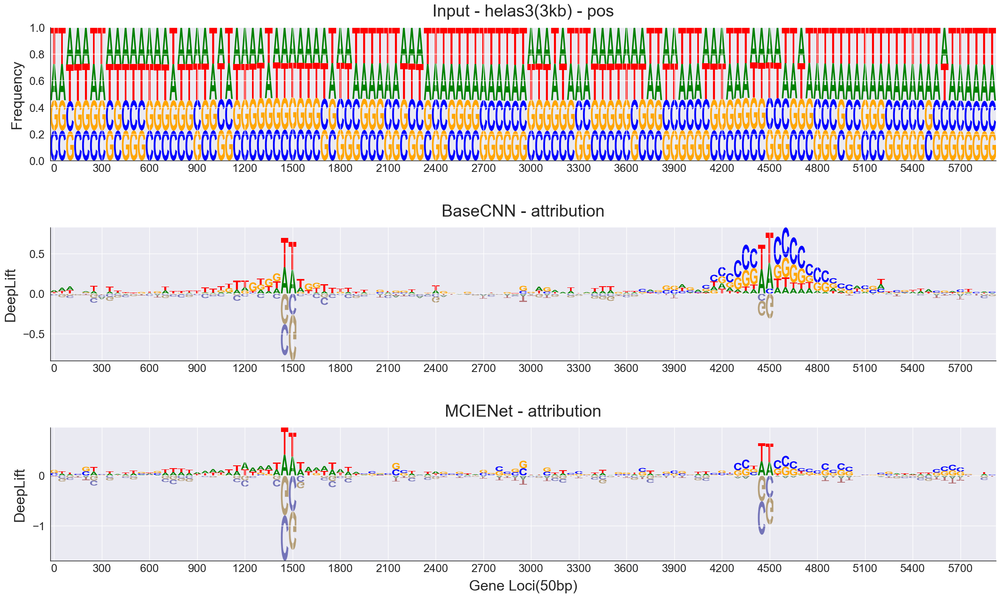

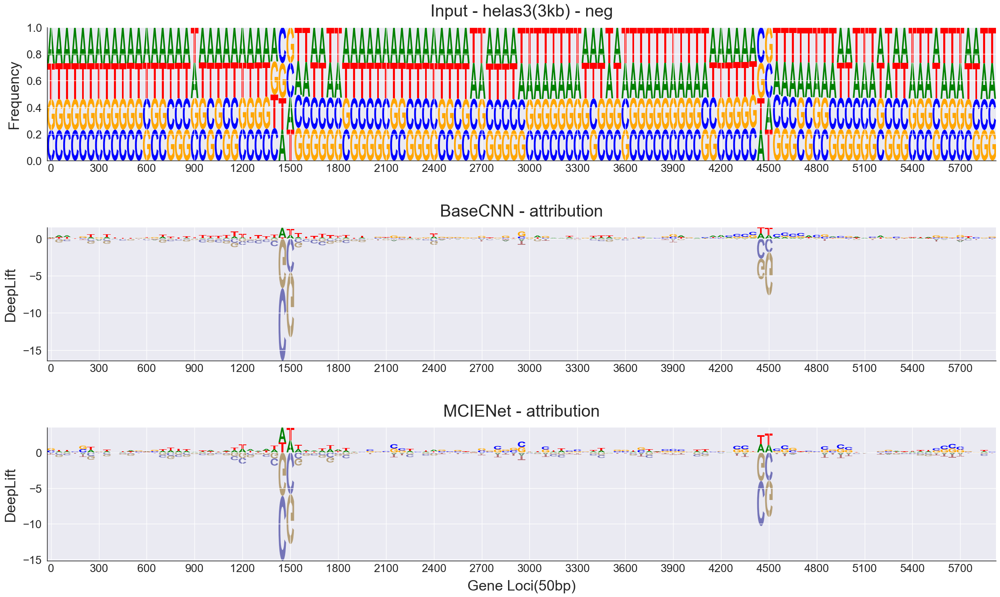

In [25]:
# 文字全局大小
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20

plt.rcParams['axes.labelsize'] = 26  # 設定 x 和 y 軸標籤字體大小
plt.rcParams['axes.titlesize'] = 30  # 設定圖標題字體大小

# 圖格局
col_num = 1
row_num = 3

bin_size = 50
window_step = 50


# 在每個 subplot 上繪圖 
for data in data_ls:
    fig_pos, axes_pos = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 5*row_num))  # 調整圖形大小
    fig_neg, axes_neg = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 5*row_num))  # 調整圖形大小

    name, path = [(k,v) for k,v in BaseCNN_files.items() if k.find(data)!=-1][0]
    name2, path2 = [(k,v) for k,v in MCIENet_files.items() if k.find(data)!=-1][0]

    # read file (BaseCNN & input) ==========================================
    with h5py.File(path) as f:
        input_all = np.array(f[tar_phase]['input'])
        attr_all = np.array(f[tar_phase]['attr'])
        label_all = np.array(f[tar_phase]['label'])

    # 取正負
    pos_idx, neg_idx = np.where(label_all==1)[0], np.where(label_all==0)[0]
    pos_num, neg_num = pos_idx.shape[0], neg_idx.shape[0]

    attr_pos = scale_and_normalize_batch(attr_all[pos_idx]).sum(0)
    attr_neg = scale_and_normalize_batch(attr_all[neg_idx]).sum(0)

    input_pos = input_all[pos_idx].sum(0) / pos_num
    input_neg = input_all[neg_idx].sum(0) / neg_num

    del input_all; del attr_all ; del label_all; del pos_idx; del neg_idx

    # read file (MCIENet) ==========================================
    with h5py.File(path2) as f:
        attr_all = np.array(f[tar_phase]['attr'])
        label_all = np.array(f[tar_phase]['label'])

    # 取正負
    pos_idx, neg_idx = np.where(label_all==1)[0], np.where(label_all==0)[0]
    pos_num, neg_num = pos_idx.shape[0], neg_idx.shape[0]

    attr_pos_2 = scale_and_normalize_batch(attr_all[pos_idx]).sum(0)
    attr_neg_2 = scale_and_normalize_batch(attr_all[neg_idx]).sum(0)

    del attr_all ; del label_all; del pos_idx; del neg_idx

    # plot =========================================================
    for sample in ['pos', 'neg']:
        if sample == 'pos':
            tar_ax = axes_pos[0]
            tar_ax.set_title(f'Input - {data} - {sample}', pad=20)
            plot_matrix(tar_ax, input_pos, bin_size, window_step, xlabel=None, ylabel='Frequency')

            tar_ax = axes_pos[1]
            tar_ax.set_title('BaseCNN - attribution', pad=20)
            plot_matrix(tar_ax, attr_pos, bin_size, window_step, xlabel=None)

            tar_ax = axes_pos[2]
            tar_ax.set_title('MCIENet - attribution', pad=20)
            plot_matrix(tar_ax, attr_pos_2, bin_size, window_step)
        else:
            tar_ax = axes_neg[0]
            tar_ax.set_title(f'Input - {data} - {sample}', pad=20)
            plot_matrix(tar_ax, input_neg, bin_size, window_step, xlabel=None, ylabel='Frequency')

            tar_ax = axes_neg[1]
            tar_ax.set_title('BaseCNN - attribution', pad=20)
            plot_matrix(tar_ax, attr_neg, bin_size, window_step, xlabel=None)

            tar_ax = axes_neg[2]
            tar_ax.set_title('MCIENet - attribution', pad=20)
            plot_matrix(tar_ax, attr_neg_2, bin_size, window_step)
    
    fig_pos.tight_layout() # 自動調正版面
    fig_pos.subplots_adjust(hspace=0.5) # 子圖之間的間距
    fig_pos.savefig(os.path.join(output_folder, f'dna-seq-attr-position-distribution-map_{data}-pos.png'))

    fig_neg.tight_layout()
    fig_neg.subplots_adjust(hspace=0.5) 
    fig_neg.savefig(os.path.join(output_folder, f'dna-seq-attr-position-distribution-map_{data}-neg.png'))


### 第一版(保留)

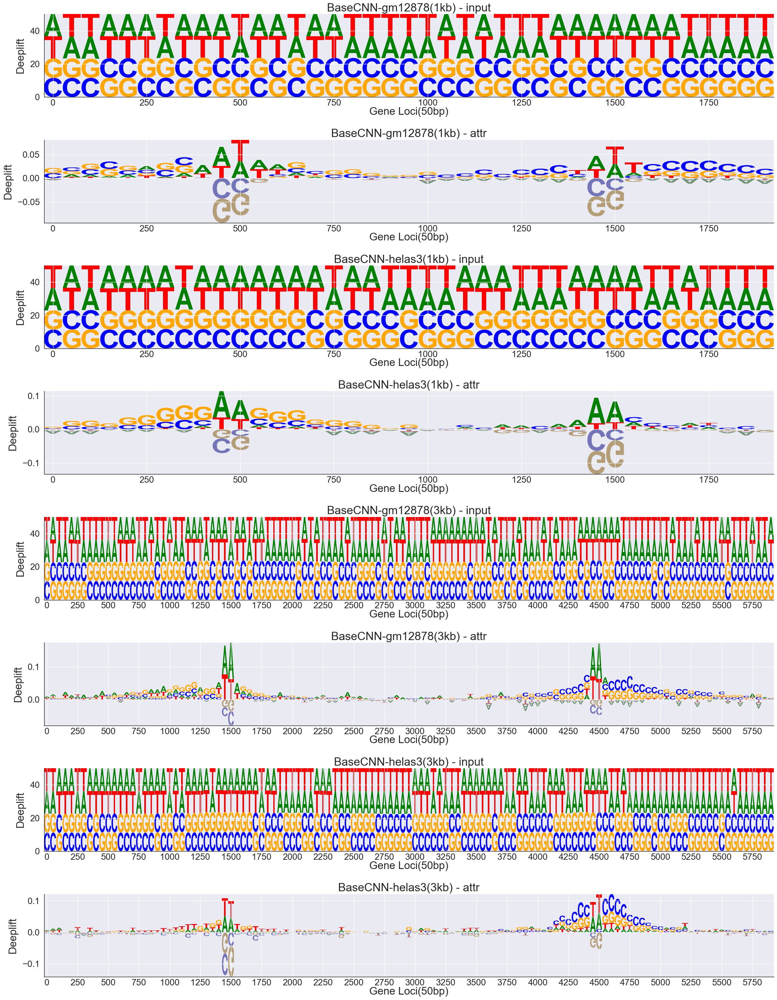

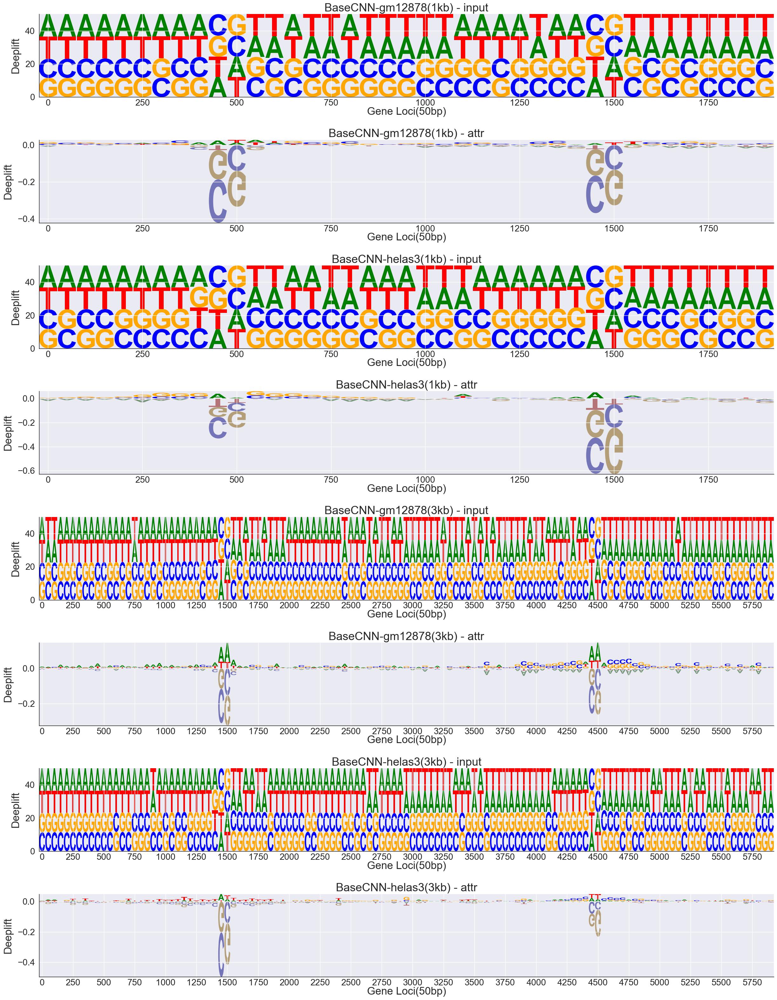

In [98]:
# 文字全局大小
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20

plt.rcParams['axes.labelsize'] = 24  # 設定 x 和 y 軸標籤字體大小
plt.rcParams['axes.titlesize'] = 26  # 設定圖標題字體大小


# 圖格局
tar_ls = list(BaseCNN_files.items())

col_num = 1
row_num = int(np.ceil(len(tar_ls) / col_num))*2

fig_pos, axes_pos = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 4*row_num))  # 調整圖形大小
fig_neg, axes_neg = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 4*row_num))  # 調整圖形大小

# 在每個 subplot 上繪圖
curr_row = 0
for name, path in tar_ls:
    # read file
    with h5py.File(path) as f:
        input_all = np.array(f[tar_phase]['input'])
        attr_all = np.array(f[tar_phase]['attr'])
        label_all = np.array(f[tar_phase]['label'])

    # 取正負
    pos_idx, neg_idx = np.where(label_all==1)[0], np.where(label_all==0)[0]
    pos_num, neg_num = pos_idx.shape[0], neg_idx.shape[0]

    attr_pos = attr_all[pos_idx].sum(0) / pos_num
    attr_neg = attr_all[neg_idx].sum(0) / neg_num

    input_pos = input_all[pos_idx].sum(0) / pos_num
    input_neg = input_all[neg_idx].sum(0) / neg_num

    del input_all; del attr_all ; del label_all

    for sample in ['pos', 'neg']:
        if sample == 'pos':
            tar_ax = axes_pos[curr_row]
            tar_ax.set_title(f'{name} - input')
            plot_matrix(tar_ax, input_pos, 50, 50)

            tar_ax = axes_pos[curr_row+1]
            tar_ax.set_title(f'{name} - attr')
            plot_matrix(tar_ax, attr_pos, 50, 50)
        else:
            tar_ax = axes_neg[curr_row]
            tar_ax.set_title(f'{name} - input')
            plot_matrix(tar_ax, input_neg, 50, 50)

            tar_ax = axes_neg[curr_row+1]
            tar_ax.set_title(f'{name} - attr')
            plot_matrix(tar_ax, attr_neg, 50, 50)
    curr_row+=2

fig_pos.tight_layout()
fig_pos.savefig(os.path.join(output_folder, 'dna-seq-attr-position-distribution-map(BaseCNN-pos).png'))

fig_neg.tight_layout()
fig_neg.savefig(os.path.join(output_folder, 'dna-seq-attr-position-distribution-map(BaseCNN-neg).png'))

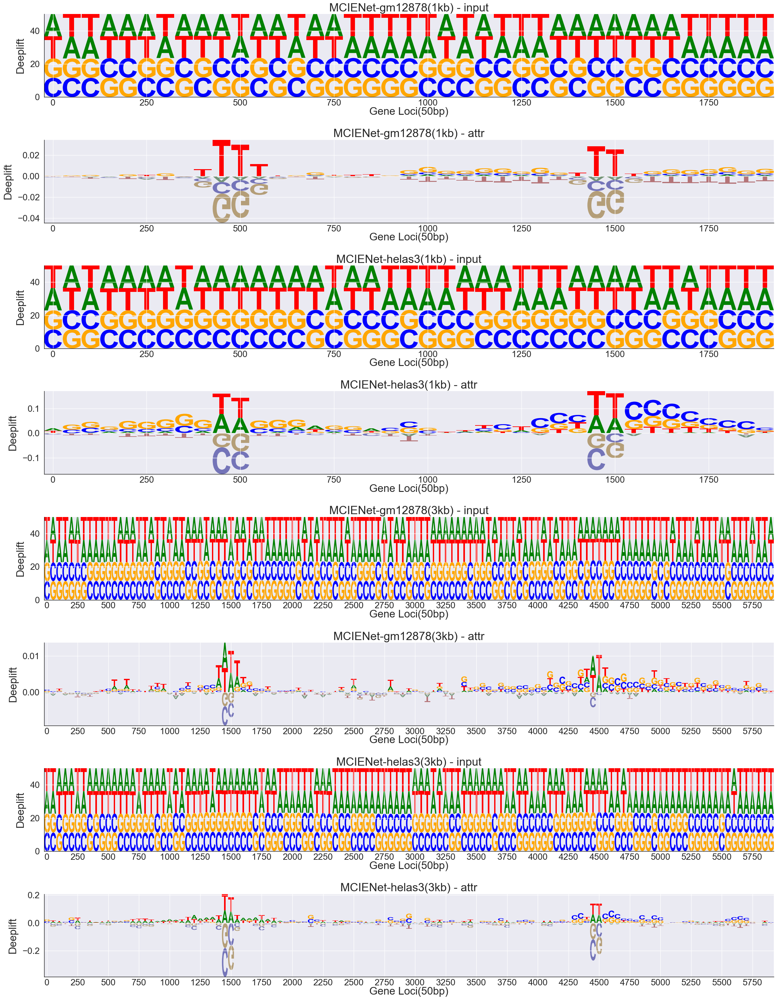

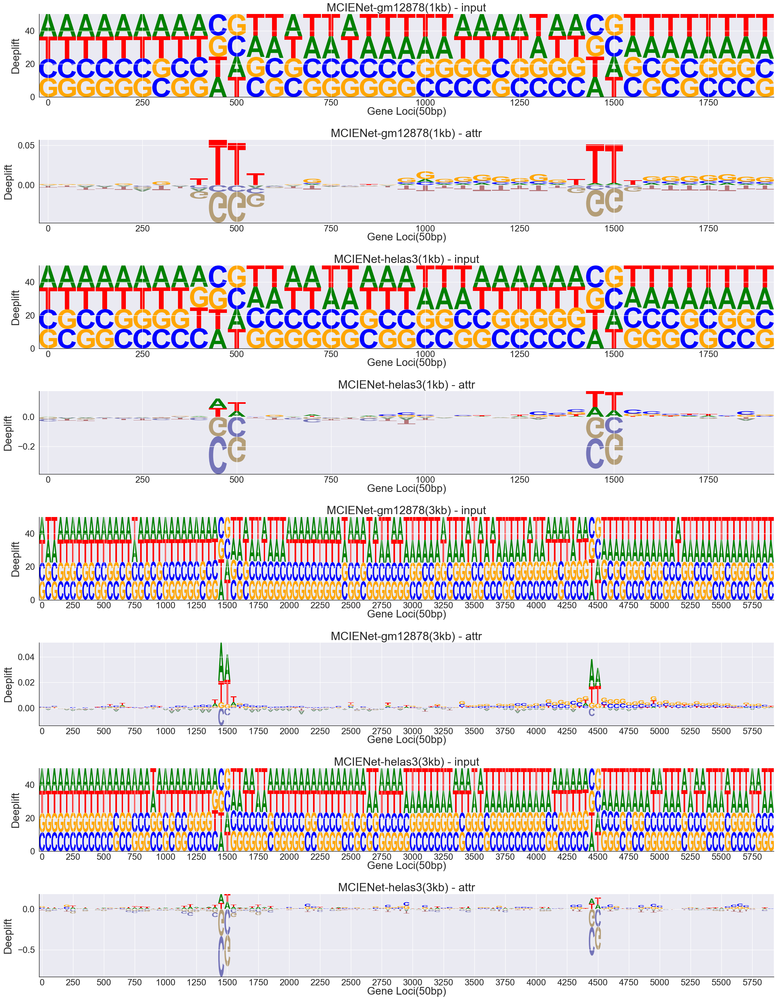

In [99]:
# 文字全局大小
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20

plt.rcParams['axes.labelsize'] = 24  # 設定 x 和 y 軸標籤字體大小
plt.rcParams['axes.titlesize'] = 26  # 設定圖標題字體大小

# 圖格局
tar_ls = list(MCIENet_files.items())

col_num = 1
row_num = int(np.ceil(len(tar_ls) / col_num))*2

fig_pos, axes_pos = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 4*row_num))  # 調整圖形大小
fig_neg, axes_neg = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 4*row_num))  # 調整圖形大小

# 在每個 subplot 上繪圖
curr_row = 0
for name, path in tar_ls:
    # read file
    with h5py.File(path) as f:
        input_all = np.array(f[tar_phase]['input'])
        attr_all = np.array(f[tar_phase]['attr'])
        label_all = np.array(f[tar_phase]['label'])

    # 取正負
    pos_idx, neg_idx = np.where(label_all==1)[0], np.where(label_all==0)[0]
    pos_num, neg_num = pos_idx.shape[0], neg_idx.shape[0]

    attr_pos = attr_all[pos_idx].sum(0) / pos_num
    attr_neg = attr_all[neg_idx].sum(0) / neg_num

    input_pos = input_all[pos_idx].sum(0) / pos_num
    input_neg = input_all[neg_idx].sum(0) / neg_num

    del input_all; del attr_all ; del label_all

    for sample in ['pos', 'neg']:
        if sample == 'pos':
            tar_ax = axes_pos[curr_row]
            tar_ax.set_title(f'{name} - input')
            plot_matrix(tar_ax, input_pos, 50, 50)

            tar_ax = axes_pos[curr_row+1]
            tar_ax.set_title(f'{name} - attr')
            plot_matrix(tar_ax, attr_pos, 50, 50)
        else:
            tar_ax = axes_neg[curr_row]
            tar_ax.set_title(f'{name} - input')
            plot_matrix(tar_ax, input_neg, 50, 50)

            tar_ax = axes_neg[curr_row+1]
            tar_ax.set_title(f'{name} - attr')
            plot_matrix(tar_ax, attr_neg, 50, 50)
    curr_row+=2

fig_pos.tight_layout()
fig_pos.savefig(os.path.join(output_folder, 'dna-seq-attr-position-distribution-map(MCIENet-pos).png'))

fig_neg.tight_layout()
fig_neg.savefig(os.path.join(output_folder, 'dna-seq-attr-position-distribution-map(MCIENet-neg).png'))

### 第二版

In [ ]:
# 文字全局大小
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20

plt.rcParams['axes.labelsize'] = 26  # 設定 x 和 y 軸標籤字體大小
plt.rcParams['axes.titlesize'] = 30  # 設定圖標題字體大小

# 圖格局
col_num = 1
row_num = 3

bin_size = 50
window_step = 50


# 在每個 subplot 上繪圖 
for data in data_ls:
    fig_pos, axes_pos = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 5*row_num))  # 調整圖形大小
    fig_neg, axes_neg = plt.subplots(nrows=row_num, ncols=col_num, figsize=(25, 5*row_num))  # 調整圖形大小

    name, path = [(k,v) for k,v in BaseCNN_files.items() if k.find(data)!=-1][0]
    name2, path2 = [(k,v) for k,v in MCIENet_files.items() if k.find(data)!=-1][0]

    # read file (BaseCNN & input) ==========================================
    with h5py.File(path) as f:
        input_all = np.array(f[tar_phase]['input'])
        attr_all = np.array(f[tar_phase]['attr'])
        label_all = np.array(f[tar_phase]['label'])

    # 取正負
    pos_idx, neg_idx = np.where(label_all==1)[0], np.where(label_all==0)[0]
    pos_num, neg_num = pos_idx.shape[0], neg_idx.shape[0]

    attr_pos = attr_all[pos_idx].sum(0)
    attr_neg = attr_all[neg_idx].sum(0)

    input_pos = input_all[pos_idx].sum(0) / pos_num
    input_neg = input_all[neg_idx].sum(0) / neg_num

    del input_all; del attr_all ; del label_all; del pos_idx; del neg_idx

    # read file (MCIENet) ==========================================
    with h5py.File(path2) as f:
        attr_all = np.array(f[tar_phase]['attr'])
        label_all = np.array(f[tar_phase]['label'])

    # 取正負
    pos_idx, neg_idx = np.where(label_all==1)[0], np.where(label_all==0)[0]
    pos_num, neg_num = pos_idx.shape[0], neg_idx.shape[0]

    attr_pos_2 = attr_all[pos_idx].sum(0)
    attr_neg_2 = attr_all[neg_idx].sum(0)

    del attr_all ; del label_all; del pos_idx; del neg_idx

    # plot =========================================================
    for sample in ['pos', 'neg']:
        if sample == 'pos':
            tar_ax = axes_pos[0]
            tar_ax.set_title(f'Input - {data} - {sample}', pad=20)
            plot_matrix(tar_ax, input_pos, bin_size, window_step, xlabel=None, ylabel='Frequency')

            tar_ax = axes_pos[1]
            tar_ax.set_title('BaseCNN - attribution', pad=20)
            plot_matrix(tar_ax, attr_pos, bin_size, window_step, xlabel=None)

            tar_ax = axes_pos[2]
            tar_ax.set_title('MCIENet - attribution', pad=20)
            plot_matrix(tar_ax, attr_pos_2, bin_size, window_step)
        else:
            tar_ax = axes_neg[0]
            tar_ax.set_title(f'Input - {data} - {sample}', pad=20)
            plot_matrix(tar_ax, input_neg, bin_size, window_step, xlabel=None, ylabel='Frequency')

            tar_ax = axes_neg[1]
            tar_ax.set_title('BaseCNN - attribution', pad=20)
            plot_matrix(tar_ax, attr_neg, bin_size, window_step, xlabel=None)

            tar_ax = axes_neg[2]
            tar_ax.set_title('MCIENet - attribution', pad=20)
            plot_matrix(tar_ax, attr_neg_2, bin_size, window_step)
    
    fig_pos.tight_layout() # 自動調正版面
    fig_pos.subplots_adjust(hspace=0.5) # 子圖之間的間距
    fig_pos.savefig(os.path.join(output_folder, f'dna-seq-attr-position-distribution-map_{data}-pos.png'))

    fig_neg.tight_layout()
    fig_neg.subplots_adjust(hspace=0.5) 
    fig_neg.savefig(os.path.join(output_folder, f'dna-seq-attr-position-distribution-map_{data}-neg.png'))
